In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
from tqdm.auto import tqdm
tqdm.pandas()  


/home/gk/.local/lib/python3.8/site-packages/geopandas/_compat.py:112: UserWarning: The Shapely GEOS version (3.10.3-CAPI-1.16.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
city_crs_dict = {
    'Санкт-Петербург': 32636,
    'Helsinki': 32635,
    'Amsterdam': 23032,
    'Stockholms kommun': 32634
}

admin_level_dict = {
    'Санкт-Петербург': 5,
    'Helsinki': 9,
    'Amsterdam': None,
    'Stockholms kommun': 9
}

In [3]:
mobility = 'euclidean'
city_name = 'Санкт-Петербург'
city_crs = city_crs_dict[city_name]
admin_level = admin_level_dict[city_name]

In [4]:
def expand_data(d, df, mobility: str) -> None:
    '''
    Развернуть исходные данные из серии в матрицу
    '''
    
    if mobility == 'bike':
        divider = 15000
    elif mobility == 'drive':
        divider = 50000
    elif mobility == 'walk':
        divider = 5000
    
    df.loc[d['id']] = eval(d[f'dist_{mobility}'])
    df.loc[d['id']] = df.loc[d['id']] / divider * 60


def get_data(mobility: str):

    if mobility == 'mmg':
        if city_name == 'Санкт-Петербург':
            df = pd.read_csv('/home/gk/Documents/matrix_mmg.csv')
            df = df.set_index('id')
        else:
            df = pd.read_pickle(f'../matrix_mmg_{city_name}.pkl')

    elif mobility == 'euclidean':
        data = pd.read_pickle(f'euclidean_{city_name}.pkl')
        # colors = data[['administrative_unit_id']]
        # idx = data.index.values
        # data.drop(columns='id', inplace=True)
        # data.columns, data.index = idx, idx
        
        df = data.T
        data = data.fillna(0)
        df = df.fillna(0)
        df = df.add(data)
        df = df.astype(int)
        df /= 18
        df = df.round(0)
        df = df.astype(int)

    else:    
        data = pd.read_csv(f'all_{mobility}_dists.csv')
        df = pd.DataFrame(columns=data.id, index=data.id)

    if mobility in ['drive', 'walk', 'bike']:
        _ = data.progress_apply(lambda d: expand_data(d, df, mobility), axis=1)

    outliers = df > 100000
    df[outliers] = np.nan
    df.fillna(df[df<100000].max().max(), inplace=True)

    del outliers

    return df

blocks = gpd.read_file(f'districts_splitted_{city_name}.geojson')
# blocks.drop(columns=['area'], inplace=True)
# blocks.reset_index(inplace=True)
# blocks.rename(columns={'index':'id'}, inplace=True)
blocks = blocks.to_crs(city_crs)

if 'id' not in blocks.columns:
    blocks.reset_index(inplace=True, drop=False)
    blocks.rename(columns={'index': 'block_id'}, inplace=True)
else:
    blocks.rename(columns={'id': 'block_id'}, inplace=True)

blocks_poly = blocks.copy()

blocks['centroids'] = blocks['geometry'].centroid
blocks.drop(columns=['geometry'], inplace=True)
blocks.rename(columns={'centroids':'geometry'}, inplace=True)

df = get_data(mobility)

df.columns = df.columns.astype(int)
df.index = df.index.astype(int)

df = df.loc[(df.index.isin(blocks['block_id'])) , (df.columns.isin(blocks['block_id']))]
df.head()


block_id,2,3,4,5,6,7,8,10,11,12,...,6301,6302,6303,6304,6305,6306,6307,6308,6309,6310
block_id,,,,,,,,,,,,,,,,,,,,,
2,0,734,618,290,669,344,4948,342,900,607,...,1407,673,375,410,771,450,659,548,296,324
3,734,0,207,456,75,707,5630,744,285,526,...,1567,551,963,982,715,421,78,415,561,430
4,618,207,0,328,205,688,5449,558,489,320,...,1368,651,787,802,818,227,186,207,529,294
5,290,456,328,0,399,429,5185,344,662,392,...,1362,578,526,550,723,198,386,297,280,35
6,669,75,205,399,0,632,5581,704,293,522,...,1572,489,916,936,655,392,18,404,487,375


In [5]:
blocks

,block_id,geometry
0,2,POINT (347830.318 6655604.078)
1,3,POINT (352870.594 6646456.445)
2,4,POINT (350997.966 6645557.428)
3,5,POINT (349378.535 6651000.853)
4,6,POINT (352631.675 6647881.178)
...,...,...
5572,6306,POINT (349064.550 6646900.203)
5573,6307,POINT (352472.430 6647730.795)
5574,6308,POINT (349116.139 6644823.622)
5575,6309,POINT (350516.245 6656407.421)


In [6]:
try:
    blocks.drop(columns=['id'], inplace=True)
except KeyError:
    pass

In [7]:
blocks_poly.explore()

In [8]:
# adm_bounds = gpd.read_file('amsterdam_districts_adm.geojson')
# print(adm_bounds.crs)
# print(adm_bounds.head())

In [9]:
import pandas as pd
import geopandas as gpd
import requests
import osm2geojson

# from sqlalchemy import create_engine
# from shapely.geometry import Point
# from shapely.geometry import shape
from tqdm.notebook import tqdm
tqdm.pandas()

if city_name == 'Amsterdam':
    adm_bounds = gpd.read_file('amsterdam.geojson')
    print(adm_bounds)
    adm_bounds = adm_bounds.to_crs(city_crs)
    adm_bounds.rename(columns={'Gebied': 'name', 'Gebiedcode': 'id'}, inplace=True)
    adm_bounds = adm_bounds[["geometry", "id", "name"]]


else:
    # Get bound of administrative units from batabase


    def get_city_bounds(city, city_crs, lvl):
        
        overpass_url = "http://overpass-api.de/api/interpreter"
        overpass_query = f"""
        [out:json];
                area['name'='{city}']->.searchArea;
                (
                  node["admin_level"="{lvl}"](area.searchArea);
                  way["admin_level"="{lvl}"](area.searchArea);
                  relation["admin_level"="{lvl}"](area.searchArea);
                );
        out geom;
        """
        result = requests.get(overpass_url, params={'data': overpass_query}).json()
        adm_bounds = osm2geojson.json2geojson(result)
        adm_bounds = gpd.GeoDataFrame.from_features(adm_bounds["features"]).set_crs(4326).to_crs(city_crs)
        adm_bounds = adm_bounds[["geometry", "id", "tags"]]

        adm_bounds['name'] =  adm_bounds.from_records(adm_bounds.tags)['name']
        adm_bounds = adm_bounds[['name', 'geometry']]

        if city_name == 'Stockholms kommun':
            adm_bounds.rename(columns={'Stadsdeel': 'name'}, inplace=True)
            adm_bounds['name'] = adm_bounds['name'].str.replace('stadsdelsområde', '')

        return adm_bounds


    adm_bounds = get_city_bounds(city_name, city_crs, admin_level)
    # adm_bounds = adm_bounds[adm_bounds['id'] != 5701296]
    adm_bounds.reset_index(inplace=True, drop=True)

adm_bounds.explore()

/home/gk/.local/lib/python3.8/site-packages/osm2geojson/main.py:514: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for line in merged_line:


In [10]:
adm_bounds = adm_bounds[adm_bounds.geometry.type.isin(["MultiPolygon", 'Polygon'])]
adm_bounds.name = adm_bounds.name.str.replace(' ', '')

if city_name == 'Санкт-Петербург':
    adm_bounds['name'] = adm_bounds['name'].str.replace('район', '')
    names = pd.read_csv('adm_names.csv', index_col=0)
    names['name_en'] = [
        'Vyborgskiy',
        'Petrodvortsoviy',
        'Primorskiy',
        'Kurortniy',
        'Krondshtadtskiy',
        'Kirovskiy',
        'Nevskiy',
        'Krasnogvardeyskiy',
        'Krasnoselskiy',
        'Pushkinskiy',
        'Kolpinskiy',
        'Moskovskiy',
        'Centralniy',
        'Petrogradskiy',
        'Kalininskiy',
        'Vasileostrovskiy',
        'Frunzenskiy',
        'Admiralteiskiy'
    ]

    adm_bounds = adm_bounds.merge(names, left_on='name', right_on='name', how='outer')
    adm_bounds.drop(columns=['name'], inplace=True)
    adm_bounds.rename(columns={'name_en': 'name'}, inplace=True)
    adm_bounds.dropna(subset=['name'], inplace=True)

    if 'id' not in adm_bounds.columns:
        adm_bounds.reset_index(inplace=True, drop=False)
        adm_bounds.rename(columns={'index':'adm_id'}, inplace=True)
    else:
        adm_bounds.rename(columns={'id':'adm_id'}, inplace=True)
    adm_bounds = adm_bounds.to_crs(city_crs)

In [11]:
adm_bounds

,geometry,adm_id,name
1,"MULTIPOLYGON (((356560.919 6635178.995, 356420...",56.0,Kolpinskiy
2,"MULTIPOLYGON (((343340.743 6618286.091, 343574...",55.0,Pushkinskiy
3,"MULTIPOLYGON (((342850.374 6632637.987, 342856...",57.0,Moskovskiy
4,"MULTIPOLYGON (((334750.064 6619025.201, 334695...",54.0,Krasnoselskiy
5,"MULTIPOLYGON (((334515.042 6639897.185, 334522...",47.0,Petrodvortsoviy
6,"MULTIPOLYGON (((352575.300 6644754.643, 352583...",52.0,Nevskiy
7,"MULTIPOLYGON (((350853.802 6644732.813, 350867...",62.0,Frunzenskiy
8,"MULTIPOLYGON (((346196.849 6643612.225, 346245...",63.0,Admiralteiskiy
9,"MULTIPOLYGON (((342784.936 6649713.160, 342772...",61.0,Vasileostrovskiy
10,"MULTIPOLYGON (((337240.431 6665849.511, 337125...",46.0,Vyborgskiy


In [12]:
blocks.explore()

In [13]:
# blocks_poly = blocks_poly[blocks_poly['id'].isin(blocks['id'])]

In [14]:
# blocks_poly.shape

In [15]:
# blocks.rename(columns={'id_left': 'block_id', 'id_right': 'adm_id'}, inplace=True)


In [16]:
df

block_id,2,3,4,5,6,7,8,10,11,12,...,6301,6302,6303,6304,6305,6306,6307,6308,6309,6310
block_id,,,,,,,,,,,,,,,,,,,,,
2,0,734,618,290,669,344,4948,342,900,607,...,1407,673,375,410,771,450,659,548,296,324
3,734,0,207,456,75,707,5630,744,285,526,...,1567,551,963,982,715,421,78,415,561,430
4,618,207,0,328,205,688,5449,558,489,320,...,1368,651,787,802,818,227,186,207,529,294
5,290,456,328,0,399,429,5185,344,662,392,...,1362,578,526,550,723,198,386,297,280,35
6,669,75,205,399,0,632,5581,704,293,522,...,1572,489,916,936,655,392,18,404,487,375
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6306,450,421,227,198,392,626,5222,331,684,199,...,1220,722,562,576,879,0,374,101,473,168
6307,659,78,186,386,18,631,5567,688,311,504,...,1554,500,901,921,666,374,0,385,484,361
6308,548,415,207,297,404,723,5265,387,694,124,...,1174,789,624,633,951,101,385,0,567,265


In [17]:
# df = df[df.index.isin(blocks['block_id'])]
# df = df[df.columns.intersection(blocks['block_id'])]

In [18]:
# df.index = blocks['block_id']
# df.columns = blocks['block_id']

In [19]:
from sklearn.mixture import GaussianMixture as GMM
import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
import plotly.express as px

tsne = TSNE(n_components=2, perplexity=100, n_iter=1000, random_state=7575)
tsne_results = tsne.fit_transform(df)

/home/gk/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/gk/.local/lib/python3.8/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


100%|██████████| 18/18 [04:54<00:00, 16.35s/it]


Text(0, 0.5, 'Score')

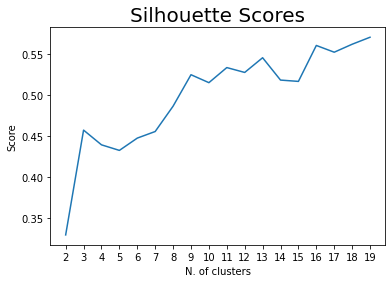

In [20]:
from sklearn import metrics
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
tqdm.pandas()

def SelBest(arr:list, X:int)->list:
    '''
    returns the set of X configurations with shorter distance
    '''
    dx=np.argsort(arr)[:X]
    return arr[dx]

n_clusters=np.arange(2, 20)
sils=[]
sils_err=[]
iterations=20
for n in tqdm(n_clusters):
    tmp_sil=[]
    for _ in range(iterations):
        gmm=GMM(n, n_init=2, random_state=7575, covariance_type='diag', init_params='kmeans').fit(tsne_results) 
        labels=gmm.predict(tsne_results)
        sil=metrics.silhouette_score(tsne_results, labels, metric='euclidean')
        tmp_sil.append(sil)
    val=np.mean(SelBest(np.array(tmp_sil), int(iterations/5)))
    err=np.std(tmp_sil)
    sils.append(val)
    sils_err.append(err)

plt.errorbar(n_clusters, sils, yerr=sils_err)
plt.title("Silhouette Scores", fontsize=20)
plt.xticks(n_clusters)
plt.xlabel("N. of clusters")
plt.ylabel("Score")

In [21]:
dct_tmp = {n_clusters[i]: sils[i] for i in range(len(n_clusters))}
max_score_clust = max(dct_tmp, key=dct_tmp.get)

In [22]:
max_score_clust

19

In [23]:
gmm = GMM(n_components=max_score_clust, random_state=7575, covariance_type='diag', init_params='kmeans').fit_predict(tsne_results)

In [24]:
# pd.DataFrame(gmm, columns=['cluster'])

In [25]:
# df_median = df.median().reset_index(drop=False).rename(columns={'index': 'block_id', 0: 'median'})
# df_median.rename(columns={'id': 'block_id'}, inplace=True)
# df_median

In [26]:
blocks = blocks.sjoin(adm_bounds, how="left").dropna(subset=['name'])
blocks.drop(columns=['index_right'], inplace=True)
blocks

,block_id,geometry,adm_id,name
0,2,POINT (347830.318 6655604.078),48.0,Primorskiy
1,3,POINT (352870.594 6646456.445),58.0,Centralniy
2,4,POINT (350997.966 6645557.428),63.0,Admiralteiskiy
3,5,POINT (349378.535 6651000.853),59.0,Petrogradskiy
4,6,POINT (352631.675 6647881.178),58.0,Centralniy
...,...,...,...,...
5572,6306,POINT (349064.550 6646900.203),63.0,Admiralteiskiy
5573,6307,POINT (352472.430 6647730.795),58.0,Centralniy
5574,6308,POINT (349116.139 6644823.622),63.0,Admiralteiskiy
5575,6309,POINT (350516.245 6656407.421),46.0,Vyborgskiy


In [27]:
# gmm_df = pd.concat([pd.DataFrame(tsne_results), pd.DataFrame(gmm, columns=['cluster'])], axis=1)
# gmm_df['block_id'] = df.index.values
# gmm_df.rename(columns={0: 'x', 1: 'y'}, inplace=True)
# gmm_df = gmm_df[gmm_df['block_id'].isin(blocks['block_id'])]
# # gmm_df.reset_index(drop=False, inplace=True)
# gmm_df

In [28]:
# test = gmm_df.merge(blocks, left_on='block_id', right_on='block_id')
# test

In [29]:

# import seaborn as sns

# sns.color_palette("husl", 9, as_cmap=False)
# sns.set(rc={'figure.figsize':(11, 11)})
# sns.scatterplot(data=test, x="x", y="y", hue="cluster", legend="full")

In [30]:
# 1/0

In [31]:
# test_df = gmm_df.merge(df_median, left_on='block_id', right_on='block_id')
# test_df

In [32]:
# df_ = test_df[['cluster', 'median']].groupby('cluster').median().rename(columns={'median': 'cluster_median'}).reset_index(drop=False)
# # df_.sort_values(by='cluster_median').reset_index(drop=True)

In [33]:
# test_df2 = test_df.merge(df_, left_on='cluster', right_on='cluster')
# test_df2

In [34]:
# blocks

In [35]:
# test_df2 = test_df.merge(blocks, left_on='block_id', right_on='block_id')
# test_df2

In [36]:
# import seaborn as sns

# sns.color_palette("husl", 9, as_cmap=False)
# sns.set(rc={'figure.figsize':(11, 11)})
# sns.scatterplot(data=test_df2, x="x", y="y", hue="name", legend="full")

In [37]:
# df_median

In [38]:
# gmm_df

euclidean


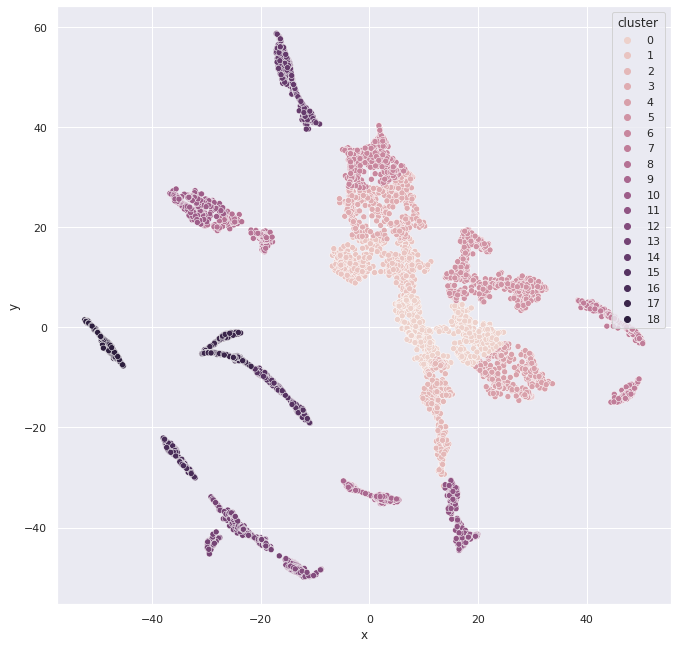

In [39]:
import seaborn as sns
print(mobility)
import matplotlib.pyplot as plt


gmm_df = pd.concat([pd.DataFrame(tsne_results), pd.DataFrame(gmm, columns=['cluster'])], axis=1)
gmm_df['cluster'] += 1
gmm_df['block_id'] = df.index.values
gmm_df.rename(columns={0: 'x', 1: 'y'}, inplace=True)
# gmm_df.reset_index(drop=False, inplace=True)

df_median = df.median().reset_index(drop=False).rename(columns={'id': 'block_id', 0: 'median'})

if 'block_id' not in df_median.columns:
    df_median = df.median().reset_index(drop=False).rename(columns={'index': 'block_id', 0: 'median'})

df_median['median'] = df_median['median'].astype(int)
# try:
#     df_median.rename(columns={'id': 'index'}, inplace=True)
#     gmm_df.rename(columns={'id': 'index'}, inplace=True)
# except Exception:
#     pass

test_df = gmm_df.merge(df_median, left_on='block_id', right_on='block_id')

df_ = test_df[['cluster', 'median']].groupby('cluster').median().rename(columns={'median': 'cluster_median_time'}).reset_index(drop=False)
df_['cluster_median_time'] = df_['cluster_median_time'].astype(int)
# df_ = df_.reset_index(drop=True).reset_index(drop=False).rename(columns={'index': 'reodered_clusters'})
df_ = df_.sort_values(by='cluster_median_time').reset_index(drop=True).reset_index(drop=False).rename(columns={'index': 'reodered_clusters'})

test_df = test_df.merge(df_, left_on='cluster', right_on='cluster').drop(columns='cluster').rename(columns={'reodered_clusters': 'cluster'})
# test_df = test_df.sort_values(by='cluster_median').reset_index(drop=True).reset_index(drop=False).drop(columns=['cluster']).rename(columns={'index':'cluster'})
# test_df = test_df.rename(columns={'level_0': 'reordered_clusters'}).sort_values(by='reordered_clusters')

# fig1 = px.scatter(
#     test_df, x='x', y='y',
#     color=test_df['cluster'].astype(str),
#     labels={'color': 'Cluster'},
#     width=700, height=700,
#     marker=dict(
#             color=np.cos(x / 3),
#             colorscale="Bluered_r",
#             showscale=True,
#             colorbar=dict(title="value"),
#     )
# )

# fig1.show()

sns.color_palette("flare", as_cmap=True)
sns.set(rc={'figure.figsize':(11, 11)})
sns.scatterplot(data=test_df, x="x", y="y", hue="cluster", legend="full")
plt.savefig(f"{mobility}_{city_name}_clusters.png")


In [40]:
test_df = test_df.merge(blocks, left_on='block_id', right_on='block_id')
test_df

,x,y,block_id,median,cluster,cluster_median_time,geometry,adm_id,name
0,28.373087,-4.930352,2,1251,4,1195,POINT (347830.318 6655604.078),48.0,Primorskiy
1,24.184250,-10.199483,10,1159,4,1195,POINT (346302.063 6649159.930),61.0,Vasileostrovskiy
2,27.260342,-12.559263,16,1167,4,1195,POINT (344823.324 6648499.783),61.0,Vasileostrovskiy
3,20.893469,-8.034060,46,1158,4,1195,POINT (347347.846 6648147.377),61.0,Vasileostrovskiy
4,29.111700,-5.643517,51,1283,4,1195,POINT (347585.272 6656151.894),48.0,Primorskiy
...,...,...,...,...,...,...,...,...,...
5566,-33.613087,-28.197309,5826,2921,16,3125,POINT (325116.431 6673840.844),49.0,Kurortniy
5567,-34.196285,-27.632235,5827,2988,16,3125,POINT (324521.393 6674154.051),49.0,Kurortniy
5568,-32.208019,-29.877304,5828,2679,16,3125,POINT (327557.313 6673618.320),49.0,Kurortniy
5569,-32.778847,-29.192940,5829,2788,16,3125,POINT (326484.750 6674028.218),49.0,Kurortniy


In [41]:
test_df.drop(columns='geometry', inplace=True)

In [43]:
try:
    blocks_poly.drop(columns='id', inplace=True)
except KeyError:
    pass

In [44]:
test_df = test_df.merge(blocks_poly, left_on='block_id', right_on='block_id')

In [45]:
test_df

,x,y,block_id,median,cluster,cluster_median_time,adm_id,name,geometry
0,28.373087,-4.930352,2,1251,4,1195,48.0,Primorskiy,"MULTIPOLYGON (((348127.253 6655861.068, 347936..."
1,24.184250,-10.199483,10,1159,4,1195,61.0,Vasileostrovskiy,"MULTIPOLYGON (((346282.720 6649026.676, 346223..."
2,27.260342,-12.559263,16,1167,4,1195,61.0,Vasileostrovskiy,"MULTIPOLYGON (((344518.779 6649028.581, 345088..."
3,20.893469,-8.034060,46,1158,4,1195,61.0,Vasileostrovskiy,"MULTIPOLYGON (((347304.429 6648404.201, 347535..."
4,29.111700,-5.643517,51,1283,4,1195,48.0,Primorskiy,"MULTIPOLYGON (((347725.073 6655972.102, 347493..."
...,...,...,...,...,...,...,...,...,...
5566,-33.613087,-28.197309,5826,2921,16,3125,49.0,Kurortniy,"MULTIPOLYGON (((325478.466 6673751.790, 325442..."
5567,-34.196285,-27.632235,5827,2988,16,3125,49.0,Kurortniy,"MULTIPOLYGON (((324619.430 6673923.674, 324554..."
5568,-32.208019,-29.877304,5828,2679,16,3125,49.0,Kurortniy,"MULTIPOLYGON (((327939.514 6672618.236, 327929..."
5569,-32.778847,-29.192940,5829,2788,16,3125,49.0,Kurortniy,"MULTIPOLYGON (((326587.165 6673716.400, 326460..."


In [46]:
test_df = gpd.GeoDataFrame(test_df, geometry='geometry')

In [47]:
test_df

,x,y,block_id,median,cluster,cluster_median_time,adm_id,name,geometry
0,28.373087,-4.930352,2,1251,4,1195,48.0,Primorskiy,"MULTIPOLYGON (((348127.253 6655861.068, 347936..."
1,24.184250,-10.199483,10,1159,4,1195,61.0,Vasileostrovskiy,"MULTIPOLYGON (((346282.720 6649026.676, 346223..."
2,27.260342,-12.559263,16,1167,4,1195,61.0,Vasileostrovskiy,"MULTIPOLYGON (((344518.779 6649028.581, 345088..."
3,20.893469,-8.034060,46,1158,4,1195,61.0,Vasileostrovskiy,"MULTIPOLYGON (((347304.429 6648404.201, 347535..."
4,29.111700,-5.643517,51,1283,4,1195,48.0,Primorskiy,"MULTIPOLYGON (((347725.073 6655972.102, 347493..."
...,...,...,...,...,...,...,...,...,...
5566,-33.613087,-28.197309,5826,2921,16,3125,49.0,Kurortniy,"MULTIPOLYGON (((325478.466 6673751.790, 325442..."
5567,-34.196285,-27.632235,5827,2988,16,3125,49.0,Kurortniy,"MULTIPOLYGON (((324619.430 6673923.674, 324554..."
5568,-32.208019,-29.877304,5828,2679,16,3125,49.0,Kurortniy,"MULTIPOLYGON (((327939.514 6672618.236, 327929..."
5569,-32.778847,-29.192940,5829,2788,16,3125,49.0,Kurortniy,"MULTIPOLYGON (((326587.165 6673716.400, 326460..."


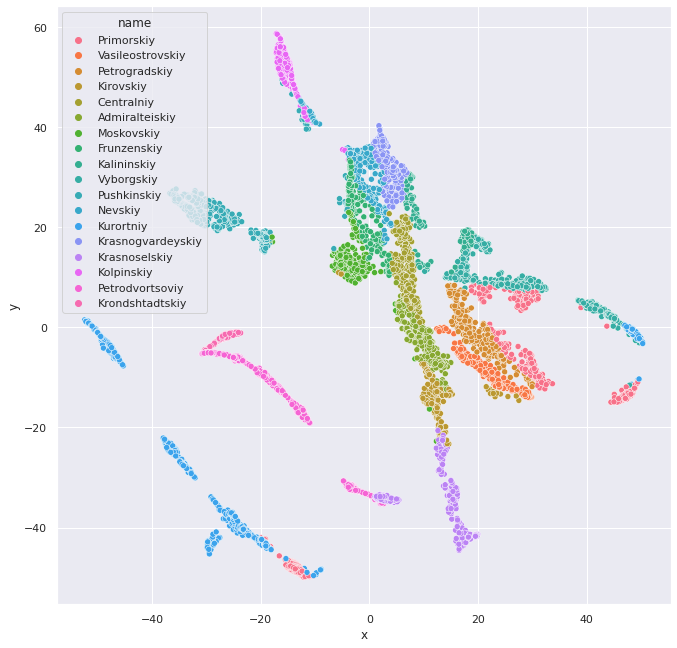

In [48]:
import matplotlib.pyplot as plt

sns.color_palette("husl", 9, as_cmap=False)
sns.set(rc={'figure.figsize':(11, 11)})
sns.scatterplot(data=test_df, x="x", y="y", hue="name", legend="full")
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1, title='Districts:')
plt.savefig(f"{mobility}_{city_name}_districts.png")

In [49]:
test_df.explore()

In [50]:
gpd.GeoDataFrame(test_df, geometry='geometry').to_file(f'{mobility}_{city_name}.geojson')
print('saved!')

saved!
